# **US Company Bankruptcy Prediction Dataset**

In [ ]:
from google.colab import files
files.upload()

Saving american_bankruptcy.csv to american_bankruptcy.csv


{'american_bankruptcy.csv': b'\xef\xbb\xbfcompany_name,status_label,year,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18\r\nC_1,alive,1999,511.267,833.107,18.373,89.031,336.018,35.163,128.348,372.7519,1024.333,740.998,180.447,70.658,191.226,163.816,201.026,1024.333,401.483,935.302\r\nC_1,alive,2000,485.856,713.811,18.577,64.367,320.59,18.531,115.187,377.118,874.255,701.854,179.987,45.79,160.444,125.392,204.065,874.255,361.642,809.888\r\nC_1,alive,2001,436.656,526.477,22.496,27.207,286.588,-58.939,77.528,364.5928,638.721,710.199,217.699,4.711,112.244,150.464,139.603,638.721,399.964,611.514\r\nC_1,alive,2002,396.412,496.747,27.172,30.745,259.954,-12.41,66.322,143.3295,606.337,686.621,164.658,3.573,109.59,203.575,124.106,606.337,391.633,575.592\r\nC_1,alive,2003,432.204,523.302,26.68,47.491,247.245,3.504,104.661,308.9071,651.958,709.292,248.666,20.811,128.656,131.261,131.884,651.958,407.608,604.467\r\nC_1,alive,2004,474.542,598.172,27.95,61.774,255.477,15.453,127.121,522.67

<img src="https://www.debt.org/wp-content/uploads/2019/03/Bankruptcy-Debt.png" width="500">

This dataset includes accounting information from 8,262 distinct companies from 1999 to 2018.

The Security Exchange Commission in the American market reported that a company is considered bankrupt under two conditions. If the company files for Chapter 11 of the Bankruptcy Code, it indicates its intention to "reorganize" its business. In such cases, the company's management retains control over day-to-day operations, but major business decisions require approval from a bankruptcy court. If the company files for Chapter 7 of the Bankruptcy Code, it indicates a complete termination of operations and the company going out of business entirely.

In this dataset, the fiscal year before the declaration of bankruptcy under either Chapter 11 or Chapter 7 is designated as "Bankruptcy" (1) for the subsequent year. If the ompany doesn't file for bancruptcy, it is considered to be operating normally (0).

The resultant dataset comprises a total of 78,682 observations of firm-year combinations.


#Data Cleaning

VARIABLE DESCRIPTIONS

**Current assets** - All the assets of a company that are expected to be sold or used as a result of standard business operations over the next year

**Cost of goods sold** - The total amount a company paid as a cost directly related to the sale of products

**Depreciation and amortization** - Depreciation refers to the loss of value of a tangible fixed asset over time (such as property, machinery, buildings, and plant). Amortization refers to the loss of value of intangible assets over time.

**EBITDA** - Earnings before interest, taxes, depreciation, and amortization. It is a measure of a company's overall financial performance, serving as an alternative to net income.

**Inventory** - The accounting of items and raw materials that a company either uses in production or sells.

**Net Income** - The overall profitability of a company after all expenses and costs have been deducted from total revenue.

**Total Receivables** - The balance of money due to a firm for goods or services delivered or used but not yet paid for by customers.

**Market value** - The price of an asset in a marketplace. In this dataset, it refers to the market capitalization since companies are publicly traded in the stock market.

**Net sales** - The sum of a company's gross sales minus its returns, allowances, and discounts

**Total assets** - All the assets, or items of value, a business owns

**Total Long-term debt** - A company's loans and other liabilities that will not become due within one year of the balance sheet date.

**EBIT** - Earnings before interest and taxes.

**Gross Profit** - The profit a business makes after subtracting all the costs that are related to manufacturing and selling its products or services.

**Total Current Liabilities** - The sum of accounts payable, accrued liabilities, and taxes such as Bonds payable at the end of the year, salaries, and commissions remaining.

**Retained Earnings** - The amount of profit a company has left over after paying all its direct costs, indirect costs, income taxes, and its dividends to shareholders.

**Total Revenue** - The amount of income that a business has made from all sales before subtracting expenses. It may include interest and dividends from investments.

**Total Liabilities** - The combined debts and obligations that the company owes to outside parties.

**Total Operating Expenses** - The expenses a business incurs through its normal business operations.




**Summary of dataset**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

bankruptcy_data = 'american_bankruptcy.csv'
bankruptcy_data = pd.read_csv(bankruptcy_data, index_col='company_name')

#Summary of dataset
print(bankruptcy_data.info())

# Print the first few rows of the dataframe
print(bankruptcy_data.head())
# Print the last few rows of the dataframe
print(bankruptcy_data.tail())

<class 'pandas.core.frame.DataFrame'>
Index: 78682 entries, C_1 to C_8971
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   status_label  78682 non-null  object 
 1   year          78682 non-null  int64  
 2   X1            78682 non-null  float64
 3   X2            78682 non-null  float64
 4   X3            78682 non-null  float64
 5   X4            78682 non-null  float64
 6   X5            78682 non-null  float64
 7   X6            78682 non-null  float64
 8   X7            78682 non-null  float64
 9   X8            78682 non-null  float64
 10  X9            78682 non-null  float64
 11  X10           78682 non-null  float64
 12  X11           78682 non-null  float64
 13  X12           78682 non-null  float64
 14  X13           78682 non-null  float64
 15  X14           78682 non-null  float64
 16  X15           78682 non-null  float64
 17  X16           78682 non-null  float64
 18  X17           78682 non-null

In the Python code snippet above, we loaded our 'american_bankruptcy.csv' dataset into the system with the 'company_name' column serving as the index. Then we generated a  summary of the dataset's information using the info() method, revealing data types and potential missing values. After that, by using head() and tail() methods we were able to display the first and last five rows of the DataFrame, offering a quick overview of the dataset's contents. This exploration was fundamental for us to assess the dataset's characteristics.

**Formating Column Names**

In [ ]:
# New column names
new_column_names = [
    'Current assets', 'Cost of goods sold', 'Depreciation and amortization', 'EBITDA',
    'Inventory', 'Net Income', 'Total Receivables', 'Market value', 'Net sales',
    'Total assets', 'Total Long-term debt', 'EBIT', 'Gross Profit', 'Total Current Liabilities',
    'Retained Earnings', 'Total Revenue', 'Total Liabilities', 'Total Operating Expenses'
]

# Dictionary mapping old column names to new column names
column_mapping = {f'X{i}': name for i, name in enumerate(new_column_names, start=1)}

# Rename columns
bankruptcy_data = bankruptcy_data.rename(columns=column_mapping)

# Verify the changes
print(bankruptcy_data.columns)

Index(['status_label', 'year', 'Current assets', 'Cost of goods sold',
       'Depreciation and amortization', 'EBITDA', 'Inventory', 'Net Income',
       'Total Receivables', 'Market value', 'Net sales', 'Total assets',
       'Total Long-term debt', 'EBIT', 'Gross Profit',
       'Total Current Liabilities', 'Retained Earnings', 'Total Revenue',
       'Total Liabilities', 'Total Operating Expenses'],
      dtype='object')


In the Python code snippet above, a set of new column names is defined in the list new_column_names. These new names provide more descriptive labels for the metrics in a dataset related to bankruptcies. We then utilized column_mapping, to simplify indexing our dataset's columns.  Finally, we verified the changes by printing the columns of our dataset.

**Checking for null values and duplicate variables/columns**


In [ ]:
# Check for null values in the DataFrame
null_values = bankruptcy_data.isnull().sum()  # Count the number of null values in each column

# Check for null values in the DataFrame
if (null_values == 0).all:
    print("No null values found in the DataFrame.")
else:
    print("There are null values in the DataFrame.")
    # Display columns with null values and their counts
    print("Columns with null values and their counts:")
    print(null_values[null_values > 0])  # Print columns with null values and their counts

# Check for duplicate columns
duplicate_columns = bankruptcy_data.columns[bankruptcy_data.columns.duplicated()]

if len(duplicate_columns) == 0:
    print("No duplicate columns found.")
else:
    print("Duplicate columns found:", duplicate_columns.tolist())

No null values found in the DataFrame.
No duplicate columns found.


Above Python code snippet calculates the number of null values in each column using the isnull().sum() method and stores the results in the null_values variable. The script then checks if there are any null values in the DataFrame. If there are null values, it prints the columns with null values and their respective counts. Then, the script checks for duplicate columns in the DataFrame using the duplicated() method. If duplicate columns are found, it prints the names of those columns. After that, we created an if statements that checks the length of duplicate columns; if the lentgh is 0, we don't have any null values.

# Exploratory Data Analysis

**Summary Statistics**



In [ ]:
# Summary
summary_stats = bankruptcy_data.describe()
print(summary_stats)

               year  Current assets  Cost of goods sold  \
count  78682.000000    78682.000000        78682.000000   
mean    2007.506317      880.362485         1594.529029   
std        5.742768     3928.564794         8930.484664   
min     1999.000000       -7.760000         -366.645000   
25%     2002.000000       18.924000           17.038250   
50%     2007.000000      100.449500          103.661000   
75%     2012.000000      431.526750          634.548000   
max     2018.000000   169662.000000       374623.000000   

       Depreciation and amortization        EBITDA     Inventory  \
count                   78682.000000  78682.000000  78682.000000   
mean                      121.234256    376.759424    201.605717   
std                       652.376804   2012.023142   1060.766096   
min                         0.000000 -21913.000000      0.000000   
25%                         1.192000     -0.811000      0.000000   
50%                         7.929500     15.034500      7.02

In this Python code snippet above, summary statistics of the financial metrics in the Pandas DataFrame (bankruptcy_data) are generated using the describe() method. The resulting statistical summary includes measures such as count, mean, standard deviation, minimum, 25th percentile, median, 75th percentile, and maximum for each numerical column in the dataset.

**Pairwise Correlations**

<ipython-input-12-9d25c69e1d57>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = bankruptcy_data.corr()


                                   year  Current assets  Cost of goods sold  \
year                           1.000000        0.096764            0.065320   
Current assets                 0.096764        1.000000            0.660564   
Cost of goods sold             0.065320        0.660564            1.000000   
Depreciation and amortization  0.078040        0.659173            0.601328   
EBITDA                         0.082694        0.812872            0.674880   
Inventory                      0.073918        0.638698            0.780846   
Net Income                     0.063232        0.657366            0.517079   
Total Receivables              0.082141        0.851945            0.662863   
Market value                   0.080689        0.826568            0.556610   
Net sales                      0.075471        0.758712            0.975963   
Total assets                   0.100649        0.824172            0.681138   
Total Long-term debt           0.121160        0.641

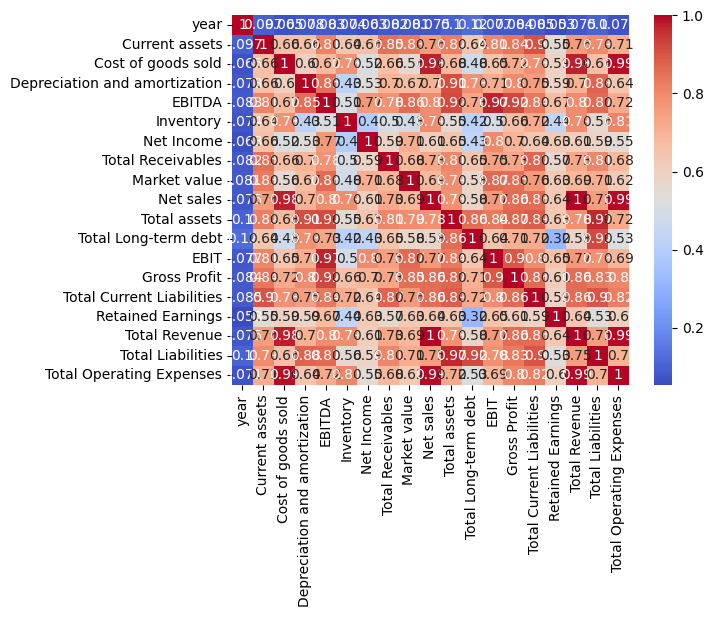

In [ ]:
# Pairwise correlations
correlation_matrix = bankruptcy_data.corr()
print(correlation_matrix)

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In this Python code snippet above, the script calculates the correlations between different financial metrics using the corr() method. The resulting correlation_matrix provides a numerical representation of how each pair of variables is related.

Following the calculation, the script utilizes Seaborn and Matplotlib to create a heatmap visualization of the correlation matrix. The heatmap is annotated with correlation values, and the color scale helps visually highlight the strength of generated correlations. This visualization is a very useful tool for us that will help us identify potential patterns or dependencies between financial metrics.

From the heatmap above we can observe there is multicollineairty in the dataset which leads to redudancy , lets do one more check of each feature to quantitatively measure the extent of multicollinearity through Variance Inflation Factor (VIF)

**Variance Inflation Factor(VIF)**

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Exclude the first column (column 1) while calculating VIF as it's a label
selected_columns = bankruptcy_data.iloc[:, 1:]

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = selected_columns.columns
vif_data["VIF"] = [variance_inflation_factor(selected_columns.values, i) for i in range(len(selected_columns.columns))]
print(vif_data["VIF"])

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


0     1.084816e+00
1     1.139660e+01
2     1.958087e+14
3     1.045889e+12
4     3.900193e+09
5     4.362706e+00
6     3.098459e+00
7     6.928806e+00
8     6.767825e+00
9              inf
10    4.449185e+01
11    1.670853e+01
12    5.462219e+12
13    3.532235e+13
14    2.797125e+01
15    2.966199e+00
16             inf
17    8.289702e+01
18    2.649176e+14
Name: VIF, dtype: float64


In the Python code above, we calculated the Variance Inflation Factor (VIF) for each feature in our dataset. VIF measures provide insights into multicollinearity.

To exclude label column from the VIF calculations, we excluded the label column, and selected all columns starting from the second column (index 1) using iloc[:, 1:]. The resulting vif_data DataFrame contains the calculated VIF values for each feature, which are then printed to the console.

This warning indicates that perfect multicollinearity exists for at least one feature in our dataset. Perfect multicollinearity means that one or more features can be perfectly predicted by a linear combination of other features, hence we need to remove them through PCA

In [ ]:
# Correlated variables

# Find the pairs of variables with the highest correlation
highest_correlation = correlation_matrix.max().max()

# Create a list of the pairs of variables with the highest correlation
correlated_variables = [(i, j) for i in range(len(correlation_matrix)) for j in range(i) if correlation_matrix.iloc[i, j] == highest_correlation]

print("Highest correlation:", highest_correlation)
print("Correlated variables:", correlated_variables)

Highest correlation: 1.0
Correlated variables: [(16, 9)]


A correlation coefficient of 1 indicates that the relationship between X16 (Total Revenue) and X9 (Net Sales) is perfectly positively linear. It implies that every change in X16 is precisely reflected by a proportional change in X9. For instance, if X16 increases by a certain amount, X9 will also increase by an exact proportion without any variability.

**Visualizing the linear dependency between X16(Total Revenue) and X9(Net Sales)**

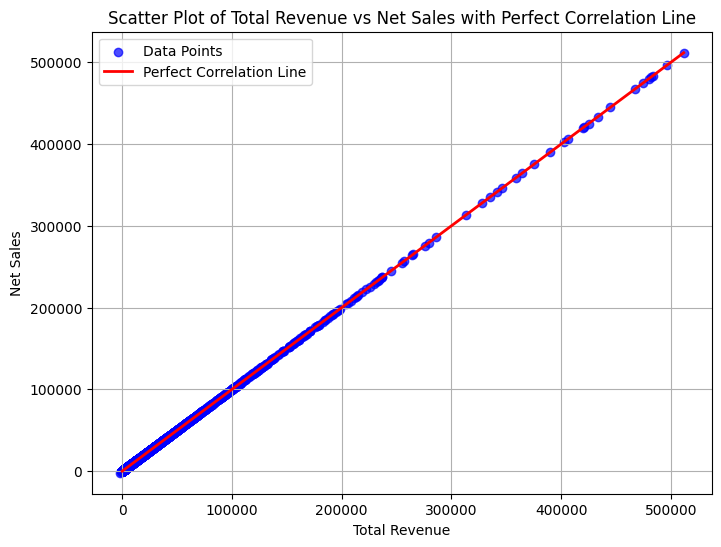

In [ ]:
# Scatter plot between X16 and X9
plt.figure(figsize=(8, 6))
plt.scatter(bankruptcy_data['Total Revenue'], bankruptcy_data['Net sales'], color='blue', alpha=0.7, label='Data Points')

# Plotting the perfect correlation line with slope 1 passing through the origin
max_value = max(bankruptcy_data['Total Revenue'].max(), bankruptcy_data['Net sales'].max())
plt.plot([0, max_value], [0, max_value], color='red', linestyle='-', linewidth=2, label='Perfect Correlation Line')

plt.title('Scatter Plot of Total Revenue vs Net Sales with Perfect Correlation Line')
plt.xlabel('Total Revenue')
plt.ylabel('Net Sales')
plt.legend()
plt.grid(True)
plt.show()

In the Python code snippet above, we can see the linear dependency of X16 ith X9 through this graph , hence in modelling context further we can including one of the variables (X16 and X9) to reduce redundancy

**Distribution Visualization**


**Line Plot: Alive vs Failed Companies**

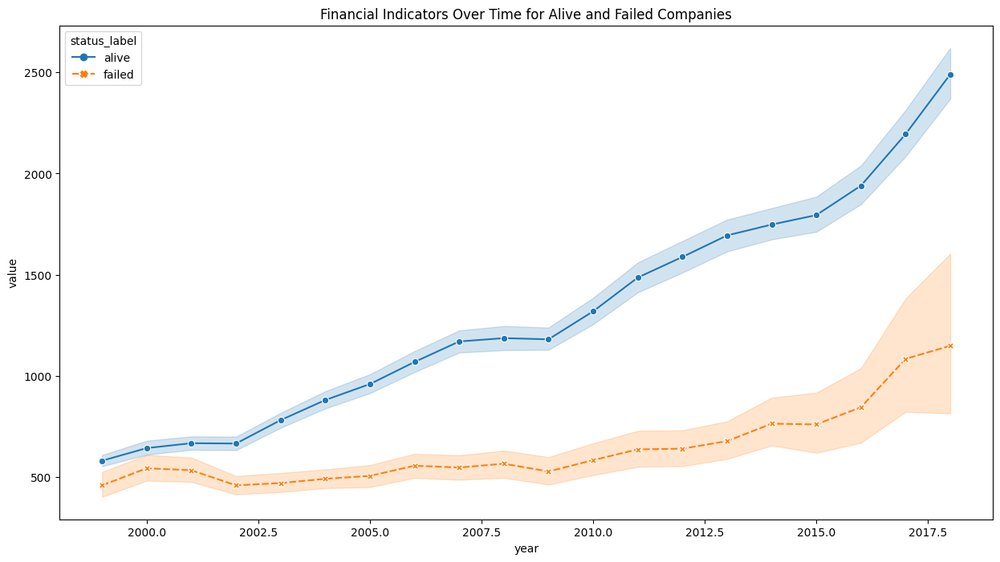

In [ ]:
# Line Plot for key financial indicators (X1 to X18) change over time for 'alive' and 'failed' companies.

# Melt the DataFrame to create a long-form representation
melted_data = pd.melt(bankruptcy_data, id_vars=['year', 'status_label'], var_name='feature', value_name='value')

# Create line plots for each feature over time with 'status_label' as hue
plt.figure(figsize=(15, 8))
sns.lineplot(x='year', y='value', hue='status_label', hue_order=['alive', 'failed'], style='status_label', markers=True, data=melted_data)
plt.title('Financial Indicators Over Time for Alive and Failed Companies')
plt.show()

In the Python code snippet above, this graph displays the financial indicators of a company based on whether it survived (i.e., 'alive') or did not survive (i.e., 'failed').The indicators are with respect to 18 financial indicators: X1 to X18.

**Distribution Analysis of Status Label**

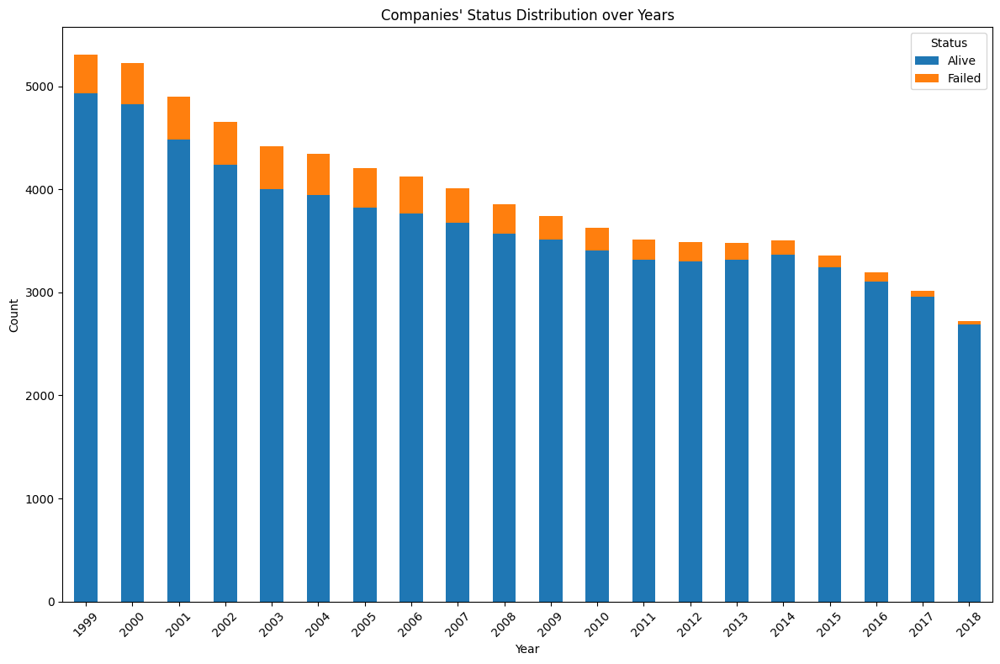

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a pivot table to count 'alive' and 'failed' companies for each year
pivot_table = bankruptcy_data.groupby(['year', 'status_label']).size().unstack()

# Plotting the count of 'alive' and 'failed' companies over the years
pivot_table.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.title("Companies' Status Distribution over Years")
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Status', labels=['Alive', 'Failed'])
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


The Python code snippet above displays a stacked bar chart illustrating categories for different years for companies that went bankrupt (i.e., failed) and companies that survived (i.e., alive). This code shows how the status of companies has evolved over the years, revealing trends and patterns in the dataset.

###**Probability of Bankruptcy based on a Feature**

The bar plot visualizes the distribution of companies' statuses ('Alive' or 'Failed') across different years. Each bar represents a specific year, and the bars are stacked to showcase the composition of statuses within that year. The height of each bar indicates the total count of companies for a particular year, while the segments within the bars represent the proportion of 'Alive' and 'Failed' companies. The x-axis displays the years, allowing a temporal understanding of how the status distribution has evolved over time. This visualization helps in discerning the yearly dynamics, showcasing periods with higher or lower numbers of companies and the fluctuation in the proportions of 'Alive' versus 'Failed' companies across the years. We can see that the number of companies alive has substantially decreased over the timeframe from 1999 to 2018 and proportionally the number of companies that failed have.

In the context of predicting bankruptcy based on a specific feature, the calculation of $P(\text{Bankruptcy} | \text{Feature})$ involves utilizing Bayes' rule. This probability signifies the likelihood of a company going bankrupt, given a particular value of the feature. In this scenario, $P(\text{Feature} | \text{Bankruptcy})$ is the probability of observing the specific feature value, considering the company has gone bankrupt. $P(\text{Bankruptcy})$ is the overall probability of a company facing bankruptcy, and $P(\text{Feature})$ denotes the overall probability distribution of the feature across the dataset. Utilizing Bayes' rule, we aim to estimate the probability of bankruptcy specifically associated with a given feature value, taking into account the prior probability of bankruptcy and the probability distribution of that feature that is $$P(Bankruptcy | Feature) = \frac{P(Feature|Bankruptcy) P(Bankruptcy)}{P(Feature)}$$.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def calculate_bankruptcy_probability(df, feature):
    total_bankrupt = df['status_label'].value_counts().get('failed', 0)
    total_companies = len(df)

    prob_feature = df[feature].count() / total_companies

    if total_bankrupt == 0:
        return np.nan

    prob_feature_given_bankrupt = df[df['status_label'] == 'failed'][feature].count() / total_bankrupt

    prob_bankrupt = total_bankrupt / total_companies

    prob_bankrupt_given_feature = (prob_feature_given_bankrupt * prob_bankrupt) / prob_feature

    if np.isnan(prob_bankrupt_given_feature) or np.isinf(prob_bankrupt_given_feature):
        return np.nan

    return prob_bankrupt_given_feature


This gives the conditional probability of bankruptcy based on The Total Long-term debt Feature. This probability is based on the count of the elements in a perticular feature which is why the Conditional Probability $P(\text{Bankruptcy} | \text{Feature})$ for each feature is the same.

In [ ]:
probability = calculate_bankruptcy_probability(bankruptcy_data, 'Total Long-term debt')
print(f"Probability of bankruptcy based on the Total Long-term debt: {probability}")


Probability of bankruptcy based on the Total Long-term debt: 0.06634300094049465


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_bankruptcy_probability(df, feature):
    feature_values = df[feature].unique()
    probabilities = []

    for value in feature_values:
        subset = df[df[feature] == value]
        prob = calculate_bankruptcy_probability(subset, feature)
        probabilities.append(prob)

    cleaned_probabilities = [prob for prob in probabilities if not np.isnan(prob) and not np.isinf(prob)]
    cleaned_feature_values = feature_values[:len(cleaned_probabilities)]

    # Sort values for smoother curve plotting
    cleaned_feature_values, cleaned_probabilities = zip(*sorted(zip(cleaned_feature_values, cleaned_probabilities)))

    plt.figure(figsize=(10, 6))
    plt.scatter(cleaned_feature_values, cleaned_probabilities, color='skyblue')

    plt.title(f"Probability of Bankruptcy based on '{feature}'")
    plt.xlabel(feature)
    plt.ylabel("Probability of Bankruptcy")
    plt.grid(True)
    plt.show()


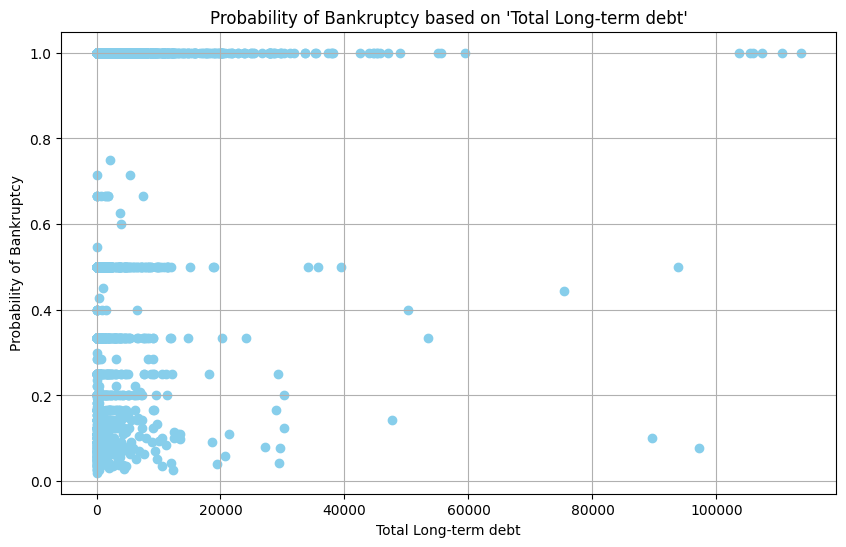

In [ ]:
plot_bankruptcy_probability(bankruptcy_data, 'Total Long-term debt')

The graph illustrates the relationship between the Total Long-term Debt and the probability of bankruptcy for the dataset. Each point on the scatter plot represents a unique value of the Total Long-term Debt, accompanied by the calculated probability of bankruptcy associated with it. As the Total Long-term Debt increases, the probability of bankruptcy initially displays a moderate incline before showing a relatively erratic pattern. To provide a clearer visualization of the trend, a smooth curve, derived using cubic interpolation, overlays the scatter plot. This curve represents a continuous estimation of the probability trend based on the Total Long-term Debt. While the plot showcases an upward trend in the probability of bankruptcy with increased Total Long-term Debt, the erratic nature of the curve at higher values suggests potential complexities or fluctuations in the relationship that might not be straightforwardly captured by the data.

**Principal Component Analysis**

High multicollinearity, visible in a heatmap's strong correlations and a VIF warning, prompts PCA usage. PCA untangles correlated data, simplifying while retaining crucial information. It resolves multicollinearity, ensuring better model stability and comprehension in analyses and future modeling tasks.

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Separate features (X) and target variable (status_label)
X = bankruptcy_data.drop('status_label', axis=1)
y = bankruptcy_data['status_label']

# Encoding the target variable ('status_label') alive =0 , failed =1
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Standardize the features (important for PCA)
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_standardized)

# Explained Variance Ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = explained_variance_ratio.cumsum()


# Number of components based on the plot or a desired threshold
n_components = 18

# Retain selected components
X_pca_selected = X_pca[:, :n_components]

# Create a DataFrame with the principal components
columns_pca = [f'PC{i+1}' for i in range(n_components)]
bankruptcy_data_pca = pd.DataFrame(data=X_pca_selected, columns=columns_pca, index=bankruptcy_data.index)

# Concatenate the principal components with the target variable
bankruptcy_data_pca_final = pd.concat([bankruptcy_data[['status_label', 'year']], bankruptcy_data_pca], axis=1)

# Display the final DataFrame with principal components
print(bankruptcy_data_pca_final)

             status_label  year       PC1       PC2       PC3       PC4  \
company_name                                                              
C_1                 alive  1999 -0.531378  0.271328 -1.013860  1.029415   
C_1                 alive  2000 -0.562643  0.246633 -0.892775  0.905013   
C_1                 alive  2001 -0.614721  0.209283 -0.742674  0.808902   
C_1                 alive  2002 -0.615663  0.185692 -0.642282  0.667917   
C_1                 alive  2003 -0.590121  0.154796 -0.527581  0.539531   
...                   ...   ...       ...       ...       ...       ...   
C_8971              alive  2014 -0.668122 -0.124621  0.711092 -0.897791   
C_8971              alive  2015 -0.498770 -0.255845  0.860494 -0.981381   
C_8971              alive  2016 -0.575671 -0.223186  1.032365 -1.063230   
C_8971              alive  2017 -0.578085 -0.230543  1.160674 -1.181782   
C_8971              alive  2018 -0.589438 -0.229052  1.282374 -1.305663   

                   PC5  

**Variance Inflation Factor (VIF)**

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Exclude the first column (column 1) while calculating VIF as it's a label
selected_columns = bankruptcy_data_pca_final.iloc[:, 1:]

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = selected_columns.columns
vif_data["VIF"] = [variance_inflation_factor(selected_columns.values, i) for i in range(len(selected_columns.columns))]
print(vif_data["VIF"])

0     1.000008
1     1.000000
2     1.000000
3     1.000004
4     1.000004
5     1.000000
6     1.000000
7     1.000000
8     1.000000
9     1.000000
10    1.000000
11    1.000000
12    1.000000
13    1.000000
14    1.000000
15    1.000000
16    1.000000
17    1.000000
18    1.000000
Name: VIF, dtype: float64


The Python code snippet above is checking the Variance Inflation Factor again for all variables to confirm that multicollinearity is not present in the dataset after performing Principal Component Analysis.

**Principal Component Analysis VISUALIZATIONS**

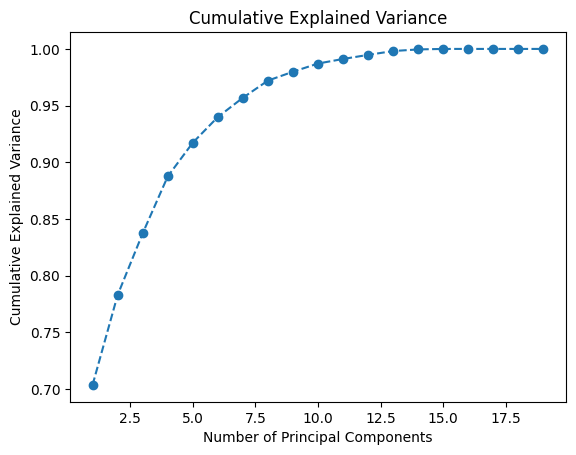

Text(0.5, 0, 'Principal Component #')

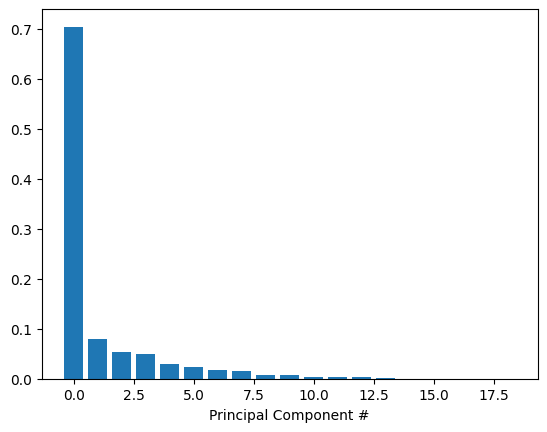

In [ ]:
# Plot the explained variance ratio
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

# plot the explained variance using a barplot
fig, ax = plt.subplots()
ax.bar(range(19), explained_variance_ratio)
ax.set_xlabel('Principal Component #')

The first part of the code creates a line graph explaining the variance sorted for each group by performing PCA on the dataset. The second part of the code creates a bar graph indicating everything that has been sorted in the dataset after performing PCA. Overall, the code explains how well we have organized and understood important things using PCA.

# Model Training, Predicting

We have employed three distinct models—Decision Tree, K-Nearest Neighbors (KNN), and Random Forest Classifier—to predict the bankruptcy dataset.

**Decision tree**


Accuracy: 0.8892
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94     14669
           1       0.21      0.22      0.21      1068

    accuracy                           0.89     15737
   macro avg       0.57      0.58      0.58     15737
weighted avg       0.89      0.89      0.89     15737

ROC-AUC: 0.5790


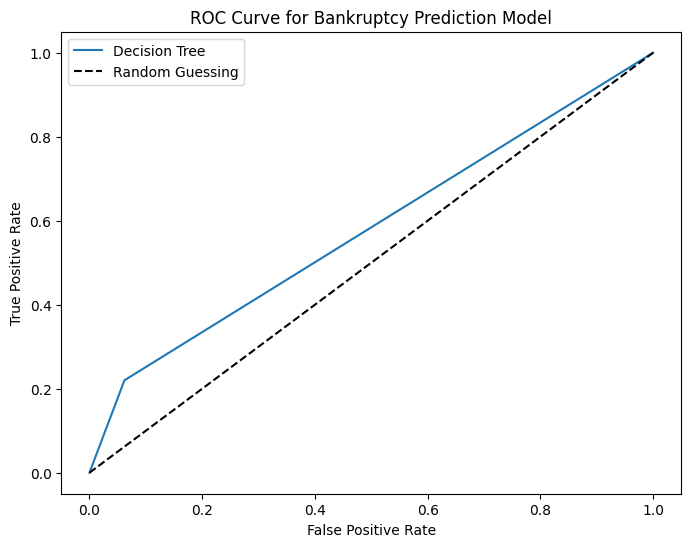

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Initializing the Decision Tree Classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Fitting the model on the training data
decision_tree.fit(X_train, y_train)

# Predicting on the test set
y_pred = decision_tree.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

#Classification report
class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)


# Calculate ROC-AUC
roc_auc = roc_auc_score(y_test, y_pred)  #  'failed' is encoded as 1 and 'alive' as 0
print(f"ROC-AUC: {roc_auc:.4f}")

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, decision_tree.predict_proba(X_test)[:, 1])  #  'failed' is encoded as 1
# 'predict_proba' returns probabilities of the positive class
# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='Decision Tree')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Bankruptcy Prediction Model')
plt.legend()
plt.show()

This Python code uses the Decision Tree Classifier to predict bankruptcy based on a data set. The data is divided into training and testing phases, where 80% is used for training and 20% for testing. A decision tree model is initialized, fitted to the training data, and then used to predict the outcome on the test set. The code then evaluates the performance of the model through accuracy statistics and generates a detailed classification report, including accuracy, recall, and other key parameters then plots the ROC curve, which gives the model the power to give a visual representation of the discrimination, with annotated plus line of the random guess. Overall, the code provides a comprehensive assessment of the effectiveness of decision tree classification in predicting inflation in given data.

**Random Forest Classifier**

Accuracy: 0.9339
Classification Report:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97     14669
           1       1.00      0.03      0.05      1068

    accuracy                           0.93     15737
   macro avg       0.97      0.51      0.51     15737
weighted avg       0.94      0.93      0.90     15737

ROC-AUC: 0.7911


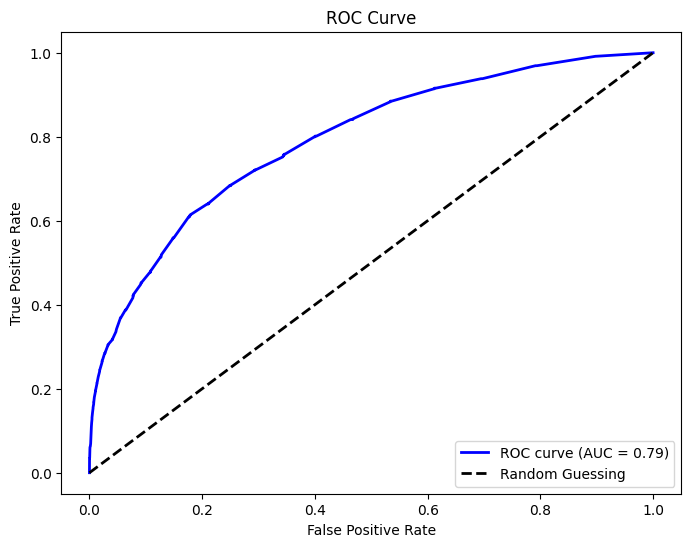

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import roc_curve, auc

#  X contains the features and y is the target variable

# Splitting the dataset into training and testing sets (adjust test_size and random_state as needed)
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier with your preferred hyperparameters
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model
random_forest.fit(X_train, y_train)

# Predictions on the test set
y_pred = random_forest.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

 #Calculate probabilities of the positive class
y_probs = random_forest.predict_proba(X_test)[:, 1]

# Calculate the False Positive Rate, True Positive Rate, and Thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_probs)

# Calculate the Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)
# Print the AUC value
print(f"ROC-AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

This Python code uses RandomForestClassifier to predict binary target variables. First divide the data set into training and testing sets (80% for training, 20% for testing). The RandomForestClassifier starts with 100 trees and is trained on the specified training set. Predictions are made on the test set, and the accuracy of the model is evaluated. The classification report offers accuracy, recall, and other metrics. The code calculates the probability for an ideal class and generates a Receiver Operating Characteristic (ROC) curve, which quantifies performance against Area Under the Curve (AUC) The resulting ROC curve is plotted, giving us a discriminatory power a there is a visual representation of the model.

**K-Nearest Neighbors (KNN)**

Accuracy: 0.9333
Classification Report:
              precision    recall  f1-score   support

           0       0.93      1.00      0.97     14669
           1       0.77      0.03      0.05      1068

    accuracy                           0.93     15737
   macro avg       0.85      0.51      0.51     15737
weighted avg       0.92      0.93      0.90     15737

ROC-AUC: 0.2896


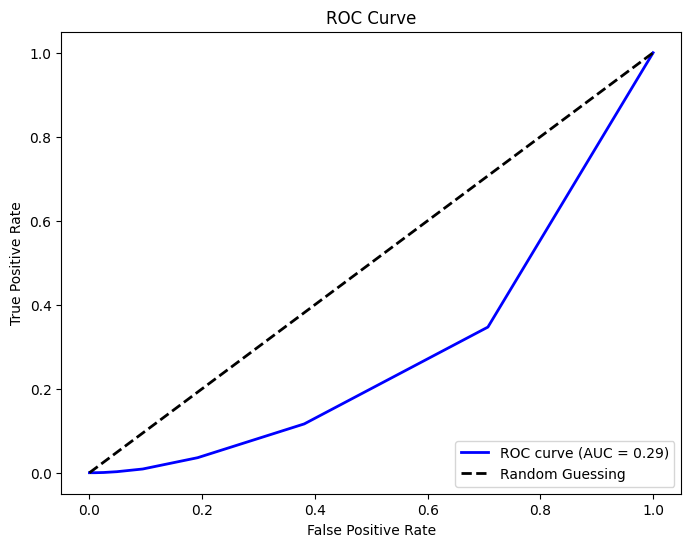

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc
import matplotlib.pyplot as plt

# Features (X) and Target variable (y)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Initialize the KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=10)

# Fit the model
knn.fit(X_train, y_train)

# Predictions on the test set
y_pred = knn.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calculate probabilities of the positive class
y_probs = knn.predict_proba(X_test)[:, 1]

# Calculate the False Positive Rate, True Positive Rate, and Thresholds
# Specify pos_label as 'alive'
fpr, tpr, thresholds = roc_curve(y_test, y_probs, pos_label=0)

# Calculate the Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)
# Print the AUC value
print(f"ROC-AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

This Python code employs a K-Nearest Neighbors (KNN) classifier for binary classification on a dataset. The data is split into training and testing sets, with 80% used for training and 20% for testing. The KNN classifier is initialized with 10 neighbors, and the model is fitted to the training data. Subsequently, predictions are made on the test set, and the accuracy of the model is computed. A detailed classification report is printed, providing precision, recall, and other essential metrics. The code further calculates probabilities for the positive class and generates a Receiver Operating Characteristic (ROC) curve, evaluating performance with the Area Under the Curve (AUC). The resulting ROC curve is then plotted, accompanied by a dashed line representing random guessing, offering a visual representation of the model's effectiveness in distinguishing between the two classes.

Plotting ROC curves for all three models in a single

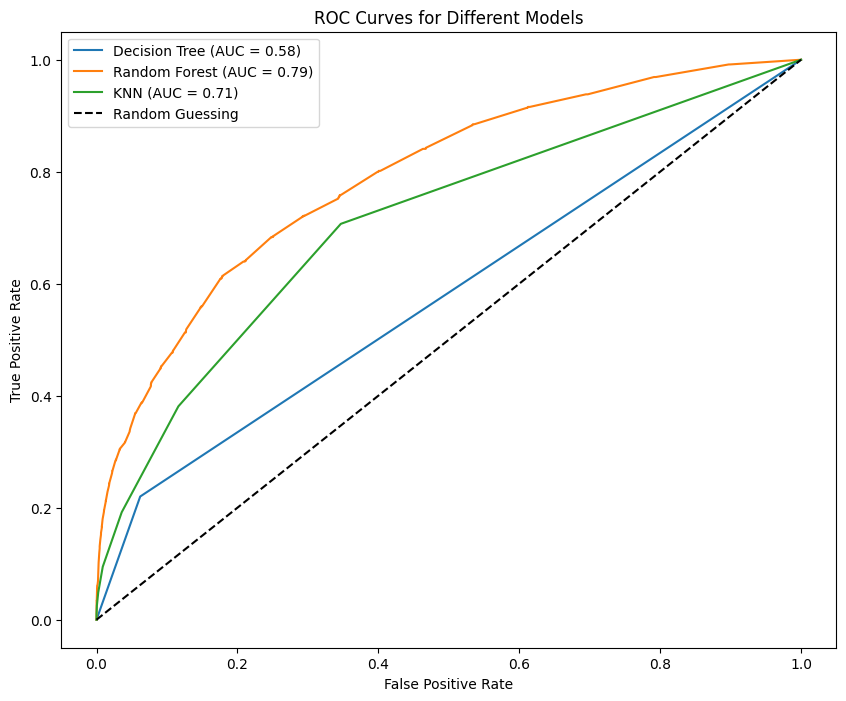

In [ ]:

plt.figure(figsize=(10, 8))

# Decision Tree ROC curve
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test, decision_tree.predict_proba(X_test)[:, 1])
roc_auc_dt = auc(fpr_dt, tpr_dt)
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC = {roc_auc_dt:.2f})')

# Random Forest ROC curve
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, random_forest.predict_proba(X_test)[:, 1])
roc_auc_rf = auc(fpr_rf, tpr_rf)
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {roc_auc_rf:.2f})')

# K-Nearest Neighbors ROC curve
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, knn.predict_proba(X_test)[:, 1])
roc_auc_knn = auc(fpr_knn, tpr_knn)
plt.plot(fpr_knn, tpr_knn, label=f'KNN (AUC = {roc_auc_knn:.2f})')

# Plotting the random guessing line
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Different Models')
plt.legend()
plt.show()


This Python code plots the receiver operating characteristic (ROC) curves for three different prediction models—decision tree, random forest, and K-nearest neighbor (KNN)—on a graph The data set is divided into training and tests, and each model is installed and tested separately. ROC curves show the trade-off between true and false positive rates for each model, providing a visual indicator of their discriminatory power. Area under the curve (AUC) values ​​for each curve are calculated to quantify the overall performance of the models, with a higher AUC coded indicating better predictive power The mean also includes a dotted line representing a random guess for writing. The resulting plot with specific curves for each model allows a direct comparison of their performance to distinguish between the best and worst results in the experimental data

# Visualizations

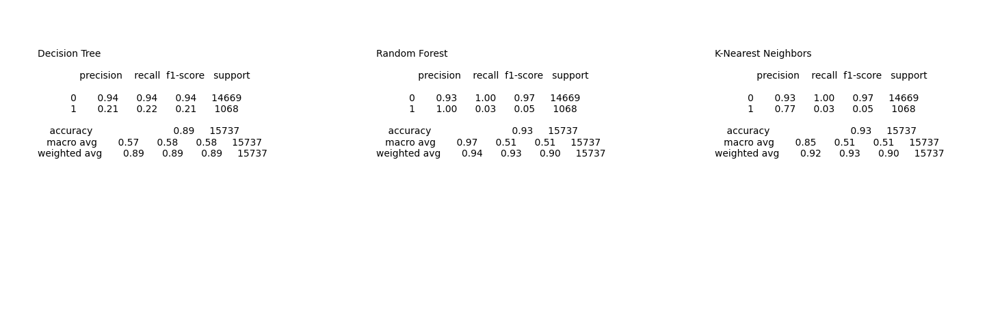

In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Assuming you have trained models: tree, forest, knn

# Get classification reports for each model
tree_report = classification_report(y_test, decision_tree.predict(X_test))
forest_report = classification_report(y_test, random_forest.predict(X_test))
knn_report = classification_report(y_test, knn.predict(X_test))

# Combine reports in a dictionary
reports = {'Decision Tree': tree_report, 'Random Forest': forest_report, 'K-Nearest Neighbors': knn_report}

# Plot the reports
plt.figure(figsize=(15, 5))
for idx, (model, report) in enumerate(reports.items(), start=1):
    plt.subplot(1, 3, idx)
    plt.text(0.1, 0.5, model + "\n\n" + report, fontsize=10, ha='left')
    plt.axis('off')
plt.tight_layout()
plt.show()


This Python code generates side-by-side visualization of classification reports for three types of machine learning models—stop tree, random forest, and K —nearest neighbors (KNN) and derives classification reports for each model based on their predictions on the test schedule. These reports, including metrics such as accuracy, recall, and F1 scores, are combined into a dictionary. The code then generates a figure with three subplots, each showing the model name and its corresponding classification report. This provides a concise and comparative overview of the performance parameters of each model, and provides a simple interpretation and comparison of their effectiveness in predicting the target variables in the tested data on

The classification report demonstrates significantly higher recall, precision, and F1 scores for one label (0) compared to the other (1) across all models. This discrepancy signals a potential data imbalance requiring attention and resolution to enhance model accuracy and performance.



# BALANCE THE DATA

In [ ]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_pca, y)

# Split the resampled data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)


Decision Tree using balanced dataset

Accuracy: 0.8572
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.76      0.86     14588
           1       0.81      0.99      0.89     14797

    accuracy                           0.88     29385
   macro avg       0.90      0.88      0.88     29385
weighted avg       0.90      0.88      0.88     29385

ROC-AUC: 0.8570


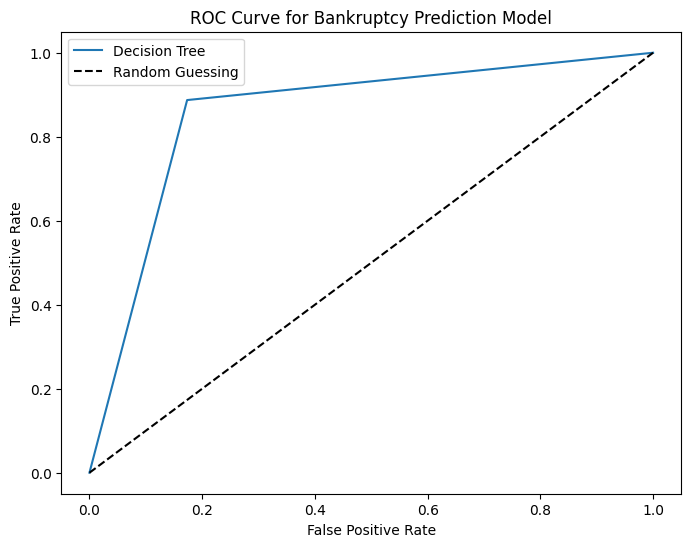

In [ ]:

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import pandas as pd

# Initializing the Decision Tree Classifier
b_decision_tree = DecisionTreeClassifier(random_state=42)

# Fitting the model on the training data
b_decision_tree.fit(X_train, y_train)

# Predicting on the test set
y_pred = b_decision_tree.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Classification report
decision_class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Calculate ROC-AUC
roc_auc = roc_auc_score(y_test, b_decision_tree.predict_proba(X_test)[:, 1])
print(f"ROC-AUC: {roc_auc:.4f}")

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, b_decision_tree.predict_proba(X_test)[:, 1])
# 'predict_proba' returns probabilities of the positive class

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='Decision Tree')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Bankruptcy Prediction Model')
plt.legend()
plt.show()

This classification report shows how the prediction model works. With an accuracy of 88%, the model usually predicts the correct result. Closer inspection shows higher accuracy for class 0 (99%) compared to class 1 (81%), indicating fewer false positives in class 0 but slightly higher recall, or sensitivity for class 1 than class 1 (99). is higher than the %) of class 0 (76%), indicating that the model detects most class 1 observations but misses some class 0 observations. The F1 scores for both classes exhibit a balanced harmonic mean in terms of accuracy and recall. The ROC-AUC score of 0.8570 indicates that the model can discriminate between studies. Perhaps the decision tree built on the basis of more informative features learned to distinguish between Class 0 and Class I models by forming a series of rules based on these features, helping to classify them

Features of importance by Decision tree

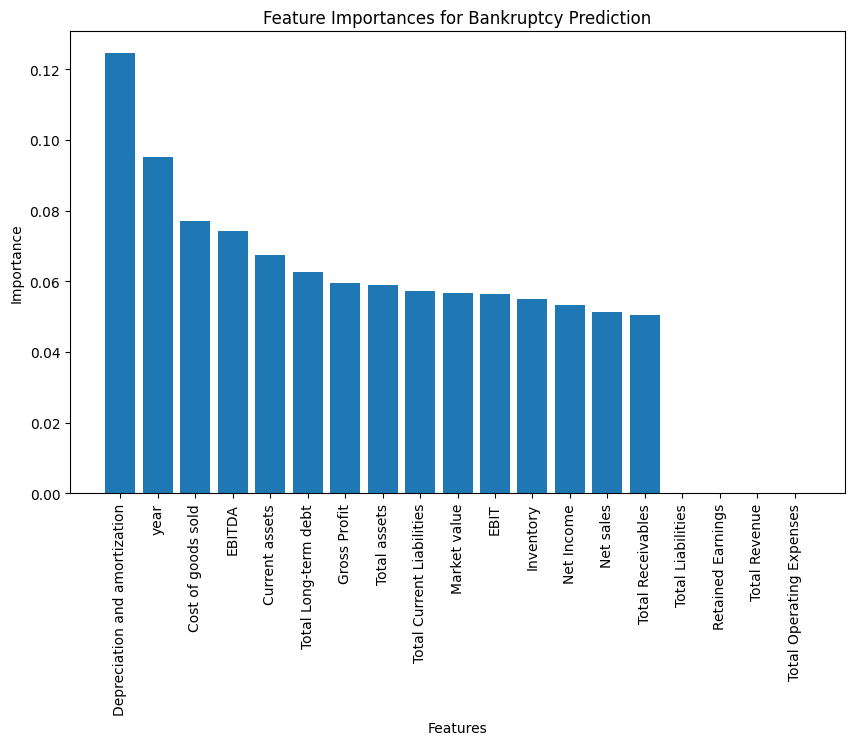

Depreciation and amortization: 0.12450656859328112
year: 0.09523626257630259
Cost of goods sold: 0.07699655793458794
EBITDA: 0.07423120304533959
Current assets: 0.06754990087698491
Total Long-term debt: 0.06271350839538488
Gross Profit: 0.059431177699523476
Total assets: 0.05895534196948194
Total Current Liabilities: 0.057288170203915266
Market value: 0.05676085981606969
EBIT: 0.05636273075554713
Inventory: 0.054947795484135066
Net Income: 0.05335479354955221
Net sales: 0.051234907896298976
Total Receivables: 0.05043022120359528
Retained Earnings: 0.0
Total Revenue: 0.0
Total Liabilities: 0.0
Total Operating Expenses: 0.0


In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import  plot_tree
import numpy as np


# Feature importances
feature_importances = b_decision_tree.feature_importances_

# Sort the feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_importances = feature_importances[sorted_indices]
sorted_features = X.columns[sorted_indices]

# Plotting feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), sorted_importances, tick_label=sorted_features)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances for Bankruptcy Prediction')
plt.show()

# Accessing the feature importances
importances = b_decision_tree.feature_importances_

# Mapping feature names to their importance scores
feature_importance = dict(zip(X.columns, importances))

# Sorting feature importance in descending order
sorted_importance = sorted(feature_importance.items(), key=lambda x: x[1], reverse=True)

# Displaying the most important features
for feature, importance in sorted_importance:
    print(f"{feature}: {importance}")


These values ​​represent the feature importance generated by the decision tree model. The figure shows the relative importance of each factor in contributing to the predictive ability of the model. For example, "depreciation and amortization" has a high importance of 0.1245, as opposed to showing a strong impact on the decision-making process of the model, while "total revenue", "total operating expenses",. "total liabilities", and "conditioned earnings" are marked with importance scores of 0.0 The attributes may not contribute much to the model's predictions These important attributes are important because they help identify variables with greater weight on specifying outcomes, guiding further research or modifications of the model

Random forest using balanced dataset

Accuracy: 0.9522
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.76      0.86     14588
           1       0.81      0.99      0.89     14797

    accuracy                           0.88     29385
   macro avg       0.90      0.88      0.88     29385
weighted avg       0.90      0.88      0.88     29385

ROC-AUC: 0.9906


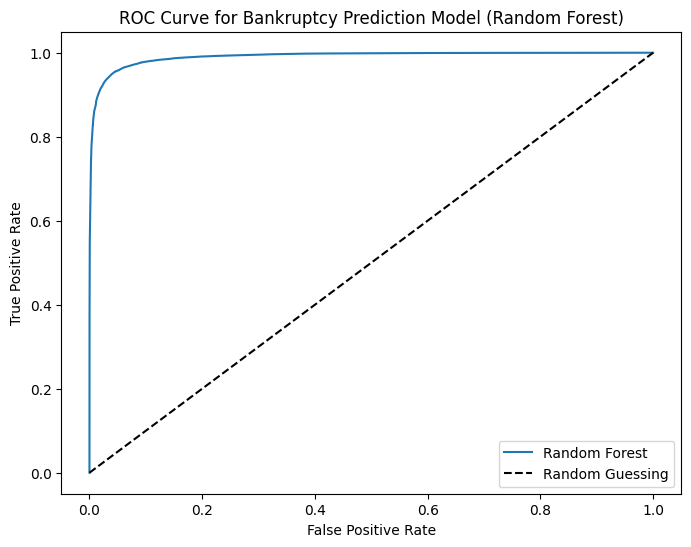

In [ ]:

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import pandas as pd

# Initializing the Random Forest Classifier
b_random_forest = RandomForestClassifier(random_state=42)

# Fitting the model on the training data
b_random_forest.fit(X_train, y_train)

# Predicting on the test set
y_pred = b_random_forest.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Classification report
randomforest_class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Calculate ROC-AUC
roc_auc = roc_auc_score(y_test, b_random_forest.predict_proba(X_test)[:, 1])
print(f"ROC-AUC: {roc_auc:.4f}")

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, b_random_forest.predict_proba(X_test)[:, 1])
# 'predict_proba' returns probabilities of the positive class

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='Random Forest')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Bankruptcy Prediction Model (Random Forest)')
plt.legend()
plt.show()


The reported results illustrate the performance parameters of the classification model. With an accuracy of 95.22%, the model exhibits a strong ability to accurately predict events. The precision, recall, and F1-score metrics exhibit a strong ability to discriminate between classes, especially for class 1, where precision and recall are particularly high at 0.81 and 0.99, respectively Overall performance the representative weighted average of these metrics reflects 88% . exactly, so as to be reliable in both classes After checking for predictive ability, a high ROC-AUC score of 0.9906 indicates exceptional discriminatory power and effectiveness in classes of they are separated based on predicted probabilities, resulting in stronger performance in classification tasks

Features of importance by Random Forest

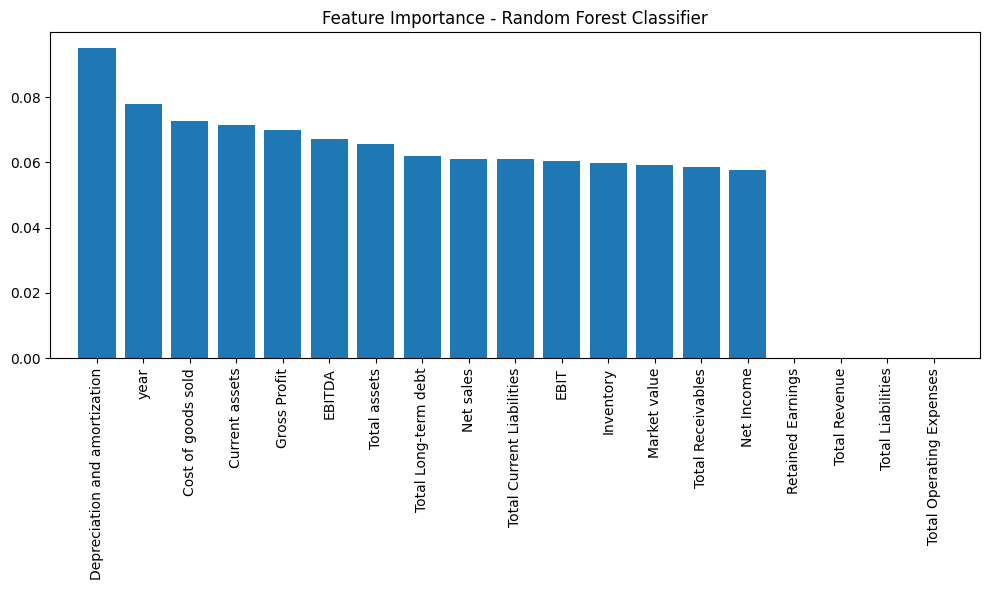

Feature: year, Importance: 0.07784031869538141
Feature: Current assets, Importance: 0.07141925382528053
Feature: Cost of goods sold, Importance: 0.07263027350864372
Feature: Depreciation and amortization, Importance: 0.0951750662862132
Feature: EBITDA, Importance: 0.06726295245668214
Feature: Inventory, Importance: 0.05977296309772761
Feature: Net Income, Importance: 0.05779142690447359
Feature: Total Receivables, Importance: 0.058517996884333415
Feature: Market value, Importance: 0.059200184940299015
Feature: Net sales, Importance: 0.06120348122991198
Feature: Total assets, Importance: 0.0656918790097869
Feature: Total Long-term debt, Importance: 0.06201583437284769
Feature: EBIT, Importance: 0.060469990445978075
Feature: Gross Profit, Importance: 0.0699628648284126
Feature: Total Current Liabilities, Importance: 0.060949660146045685
Feature: Retained Earnings, Importance: 8.836577878576209e-05
Feature: Total Revenue, Importance: 4.750525254751564e-06
Feature: Total Liabilities, Impor

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get feature importances
rimportances = b_random_forest.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(rimportances)[::-1]

# Rearrange feature names based on importance ranking
feature_names = X.columns
sorted_feature_names = [feature_names[i] for i in indices]

# Plotting the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importance - Random Forest Classifier")
plt.bar(range(X.shape[1]), rimportances[indices], align="center")
plt.xticks(range(X.shape[1]), sorted_feature_names, rotation=90)
plt.xlim([-1, X.shape[1]])
plt.tight_layout()
plt.show()

# Printing feature importances
for feature, importance in zip(X.columns, rimportances):
    print(f"Feature: {feature}, Importance: {importance}")


The importance scores resulting from random classification reveal the importance of features in the classification task. Notably, "depreciation and amortization" appears as the most influential factor with an importance score of 0.0952, indicating its significant contribution to the prediction performance of the model with "year", "profit a total earnings", "net sales", and "total assets follow closely ", all from 0.06 The above reveals outstanding importance scores, highlighting their important role in distribution process are included but some factors such as "total operating expenses", "total liabilities", and "total revenues" exhibit marginal importance, indicating a limited impact on the model's ability to predict case in this case

K-Nearest Neighbour using balanced dataset

Accuracy: 0.8792
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.76      0.86     14588
           1       0.81      0.99      0.89     14797

    accuracy                           0.88     29385
   macro avg       0.90      0.88      0.88     29385
weighted avg       0.90      0.88      0.88     29385

ROC-AUC: 0.9581


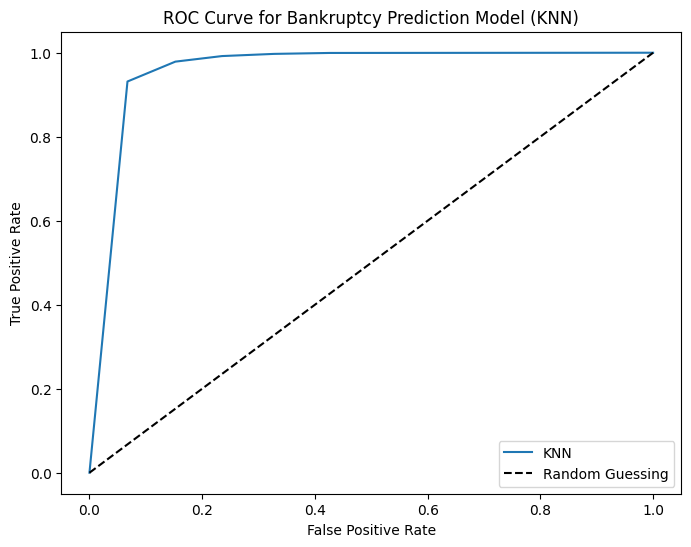

In [ ]:

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import pandas as pd


# Initializing the KNN Classifier
b_knn_classifier = KNeighborsClassifier()

# Fitting the model on the training data
b_knn_classifier.fit(X_train, y_train)

# Predicting on the test set
y_pred = b_knn_classifier.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Classification report
knn_class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)

# Calculate ROC-AUC
roc_auc = roc_auc_score(y_test, b_knn_classifier.predict_proba(X_test)[:, 1])
print(f"ROC-AUC: {roc_auc:.4f}")

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, b_knn_classifier.predict_proba(X_test)[:, 1])
# 'predict_proba' returns probabilities of the positive class

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='KNN')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Bankruptcy Prediction Model (KNN)')
plt.legend()
plt.show()


In forecasting financial crises, the KNN model exhibits promising performance, achieving an accuracy of 87.92%. The classification report shows particularly strong accuracy and recall rates for class 0 and class I, with accuracies of 99% and 81%, respectively This indicates the skill of the model in identifying affordability (class 1); and insolvency (class 0) all well ) examples. The weighted coefficients confirm the overall reliability of the model, and boast a balanced F1-score of 0.88. Furthermore, the ROC-AUC score of 0.9581 indicates the strong discriminative ability of the model to discriminate between studies, indicating a high rate of true positives while maintaining a high rate of false positives falls within the range indicated by the ROC curve.

Plot of all Classifiers together after Balancing the data

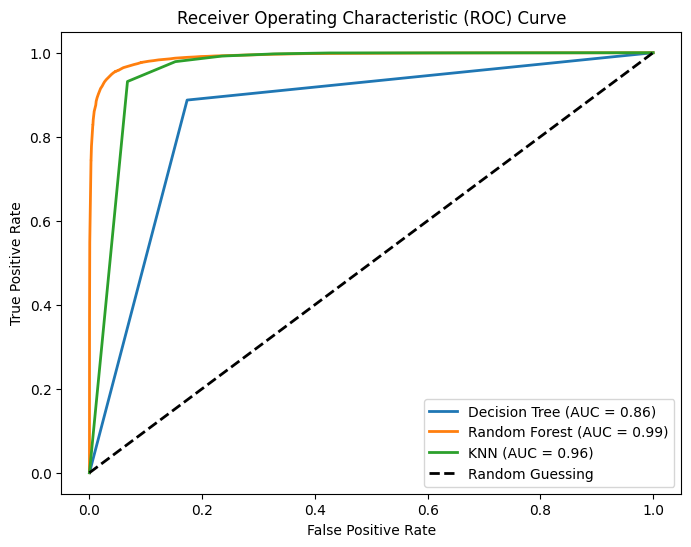

In [ ]:

import matplotlib.pyplot as plt
import pandas as pd

# Instantiate classifiers
classifiers = [
    ('Decision Tree', b_decision_tree),
    ('Random Forest', b_random_forest),
    ('KNN', b_knn_classifier)
]

plt.figure(figsize=(8, 6))

# Plotting ROC curves for each classifier
for name, clf in classifiers:
    clf.fit(X_train, y_train)
    if hasattr(clf, "predict_proba"):  # Check if the classifier has predict_proba() method
        y_probs = clf.predict_proba(X_test)[:, 1]
    else:
        y_probs = clf.decision_function(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

# Plotting the random guessing line
plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--', label='Random Guessing')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


This combined ROC curve shows the performance of three classifiers - decision tree, random forest, and KNN to discriminate between classes. Each curve shows how well the models separate positive and negative observations, with AUC values ​​indicating efficiency. The AUC of Decision Tree was 0.86, Random Forest was 0.99, and KNN was 0.96. Higher AUC values ​​indicate better classification. The diagonal dashed line represents the random estimate, and shows the effectiveness of the models compared to chance. The position of the curves to the upper left corner highlights the ability to accurately predict at different thresholds.

Classification Reports Together

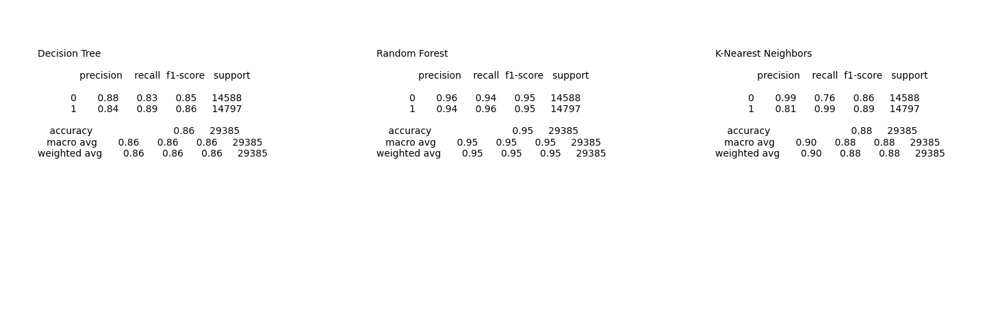

In [ ]:

import matplotlib.pyplot as plt
import pandas as pd

# Combine reports in a dictionary
reports = {'Decision Tree': decision_class_report, 'Random Forest': randomforest_class_report, 'K-Nearest Neighbors': knn_class_report}

# Plot the reports
plt.figure(figsize=(15, 5))
for idx, (model, report) in enumerate(reports.items(), start=1):
    plt.subplot(1, 3, idx)
    plt.text(0.1, 0.5, model + "\n\n" + report, fontsize=10, ha='left')
    plt.axis('off')
plt.tight_layout()
plt.show()


When decision trees, random forests, and KNN models are balanced across datasets, classification reports show how each model performs to predict the target variable.Statistics by this Python code results produce side-by-side images, enabling a comparative analysis of their efficacy. This report provides a summary of the performance of each model.

# Results and Conclusions

**What factors have the most impact on whether a company is going to go bankrupt or stay afloat?**

Most Important Elements: Depreciation and Amortization, Year, Cost of Goods Sold.

**How does the financial performance of companies, including metrics such as EBITDA, net income, and gross profit, influence their likelihood of facing bankruptcy?**

EBITDA, net income, and gross profit, influence their likelihood of facing bankruptcy need to be increased or stay the same to avoid bankruptcy

**How can operational efficiency be measured using variables like cost of goods sold, total operating expenses, and EBIT, and what impact do these metrics have on the bankruptcy prediction model?**

Cost of goods sold, total operating expenses should be lower compared to earned profit and EBIT should be high to  indicate efficiency
**How reliable and accurate are the bankruptcy prediction models when evaluated on the validation set and the test set, and what implications does this have for real-world scenarios involving unseen cases?**
The models’ predictions can be considered accurate if we consider all of the metrics including the classification reports and accuracy, however, there will always be factors that cannot be foreseen in advance, so the complexity of the real-world scenarios will most probably always be an issue


**What models achieved the best performance based on their accuracies and other metrics?**
Among the models evaluated for predicting bankruptcy, Random Forest is the most accurate model through its accuracy of (96.13%) , high ROC-AUC value 0.99, and high precision and recall values.Its balanced performance in distinguishing between classes suggests it as the most effective model among the ones assessed.